In [145]:
import glob
import pylab as pl
import numpy as np
import matplotlib
import astropy.io.fits as fits
import matplotlib.pyplot as plt

from   astropy.table import Table, vstack, join
from   desimodel.focalplane.geometry import xy2radec 
from   desimodel.io import load_fiberpos 
from   desitarget.geomask import circles 
from   desitarget.sv3.sv3_targetmask import desi_mask, bgs_mask, mws_mask 

In [11]:
def tile2rosette(tile):
    if tile < 433:
        return (tile-1)//27
    else:
        if tile >= 433 and tile < 436:
            return 13
        if tile >= 436 and tile < 439:
            return 14
        if tile >= 439 and tile < 442:
            return 15
        if tile >= 442 and tile <=480:
            return (tile-442)//3
            
        if tile > 480:
            return tile//30    
    return 999999 #shouldn't be any more?

In [13]:
tiles = Table.read('/global/cscratch1/sd/mjwilson/S4MOCK/tiles-sv3.ecsv')
tiles = tiles[(tiles['STATUS'] == 'done') & (tiles['PROGRAM']=='BRIGHT')]
tiles['ROSETTE'] = np.array([tile2rosette(x) for x in tiles['TILEID']])
tiles

TILEID,PASS,RA,DEC,PROGRAM,IN_DESI,PRIORITY,STATUS,EBV_MED,DESIGNHA,DONEFRAC,AVAILABLE,ROSETTE
int64,int32,float64,float64,str6,bool,float64,str8,float32,float32,float32,bool,int64
12,0,150.04,2.286,BRIGHT,True,0.000e+00,done,0.022782475,0.00,1.0455,False,0
13,1,150.061,2.069,BRIGHT,True,0.000e+00,done,0.023243327,0.00,1.1505,False,0
14,2,150.212,2.226,BRIGHT,True,0.000e+00,done,0.022683823,0.00,1.0456,False,0
15,3,149.98,2.171,BRIGHT,True,0.000e+00,done,0.023039486,0.00,1.1052,False,0
16,4,150.187,2.099,BRIGHT,True,0.000e+00,done,0.023041949,0.00,1.0776,False,0
17,5,150.106,2.302,BRIGHT,True,0.000e+00,done,0.022638734,0.00,1.1865,False,0
18,6,149.993,2.237,BRIGHT,True,0.000e+00,done,0.022844847,0.00,1.4589,False,0
19,7,150.128,2.065,BRIGHT,True,0.000e+00,done,0.023041053,0.00,1.3565,False,0
20,8,150.17,2.28,BRIGHT,True,0.000e+00,done,0.02263027,0.00,1.1368,False,0


In [20]:
np.unique(tiles['ROSETTE'].data)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19])

In [27]:
cmap = matplotlib.cm.get_cmap("magma", 20)

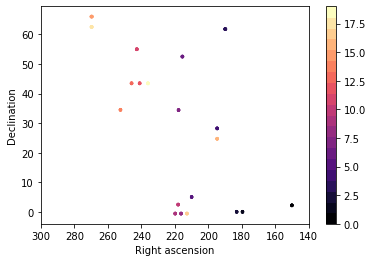

In [28]:
pl.scatter(tiles['RA'], tiles['DEC'], marker='.', lw=0.0, c=tiles['ROSETTE'], cmap=cmap)
pl.xlim(300., 140.)
pl.xlabel('Right ascension')
pl.ylabel('Declination')
pl.colorbar()

In [36]:
# glob.glob('/global/cscratch1/sd/mjwilson/S4MOCK/SV3REAL/SV3REALLEDGER/bright/*')

In [39]:
ledger = vstack([Table.read(x) for x in glob.glob('/global/cscratch1/sd/mjwilson/S4MOCK/SV3REAL/SV3REALLEDGER/bright/*')])

In [42]:
np.mean(ledger['PRIORITY_INIT'] == ledger['PRIORITY'])

0.6553668048332207

In [43]:
ledger    = ledger[ledger['PRIORITY_INIT'] == ledger['PRIORITY']]

In [45]:
len(ledger) / 1.e6

1.448765

In [61]:
tids      = tiles['TILEID'].data[tiles['ROSETTE'] == 15]
tids

array([417, 418, 419, 420, 421, 422, 423, 424, 425, 426, 427])

In [50]:
root      = '/global/cscratch1/sd/mjwilson/S4MOCK/SV3REAL/SV3REALASSIGN/'

In [58]:
nights    = [x.split('/')[-1] for x in sorted(glob.glob(root + '/*'))]
nights.remove('SV3.ecsv')
nights

['20210405',
 '20210407',
 '20210408',
 '20210409',
 '20210410',
 '20210411',
 '20210412',
 '20210413',
 '20210414',
 '20210415',
 '20210416',
 '20210417',
 '20210418',
 '20210419',
 '20210420',
 '20210422',
 '20210429',
 '20210430',
 '20210501',
 '20210502',
 '20210503',
 '20210504',
 '20210505',
 '20210506',
 '20210507',
 '20210508',
 '20210509',
 '20210510',
 '20210511',
 '20210512',
 '20210513',
 '20210514',
 '20210518',
 '20210521',
 '20210529']

In [83]:
fp            = load_fiberpos() 

In [87]:
patrol_radii  = 1.48/60. # degrees 

20210405 [417]


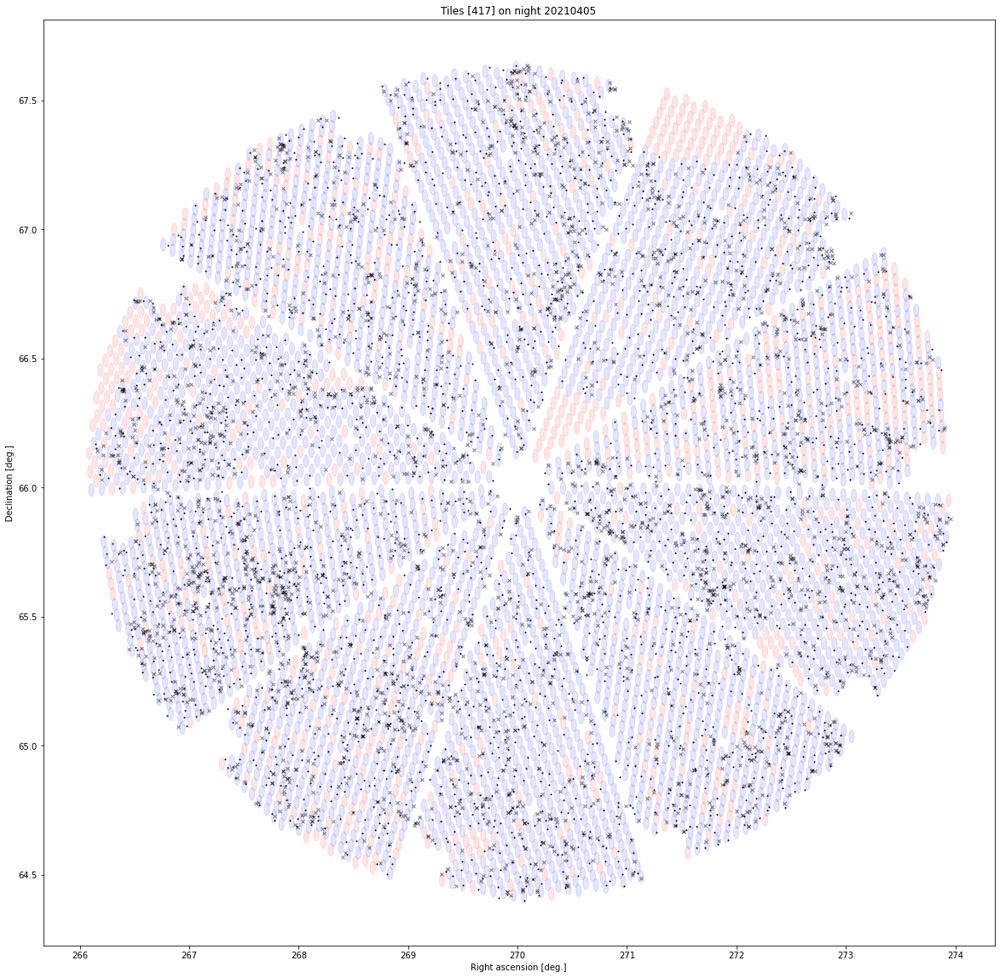

20210407 []
20210408 []
20210409 []
20210410 [418]


<Figure size 432x288 with 0 Axes>

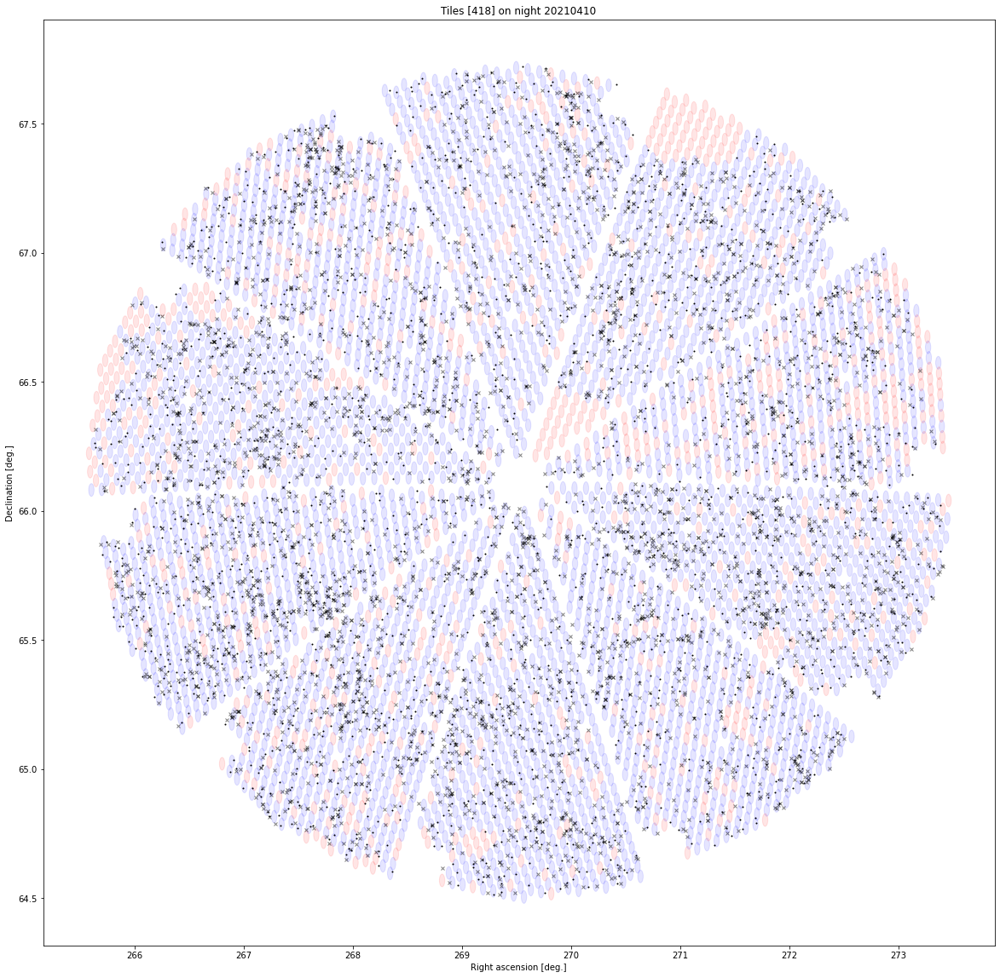

20210411 [419]


<Figure size 432x288 with 0 Axes>

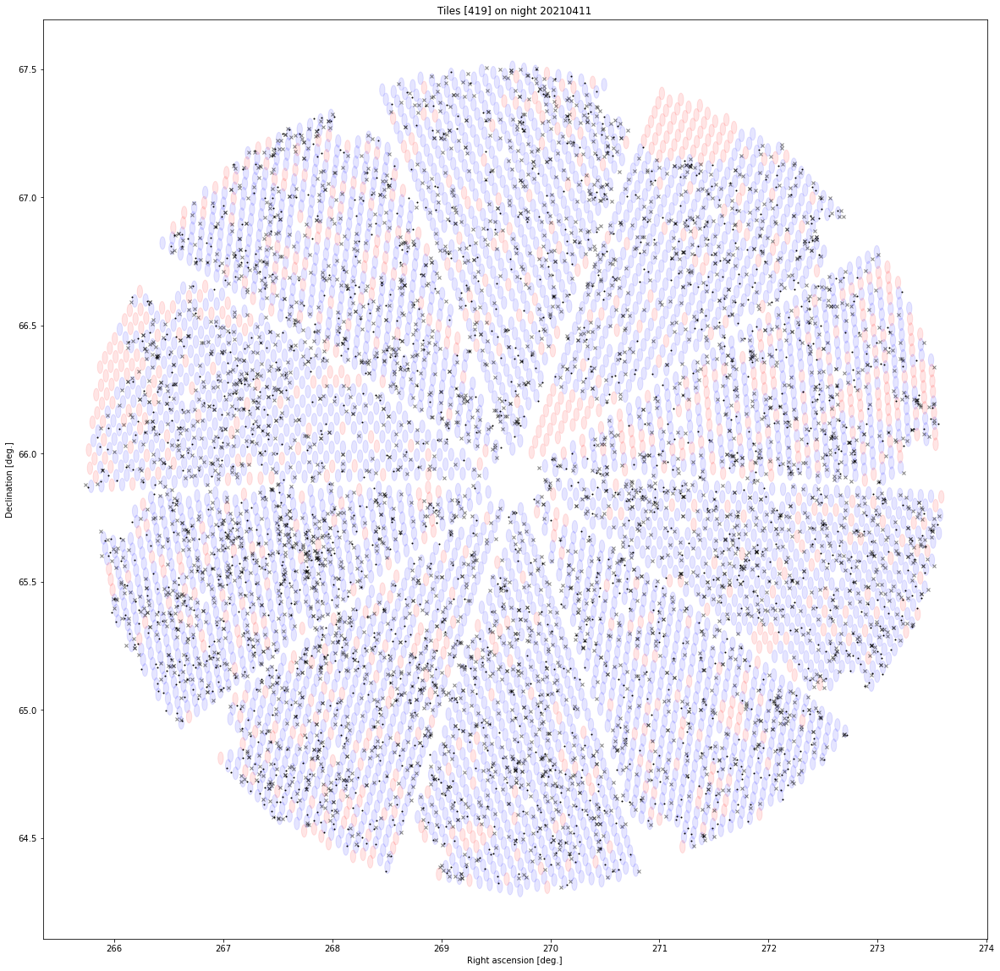

20210412 []
20210413 []
20210414 []
20210415 [420]


<Figure size 432x288 with 0 Axes>

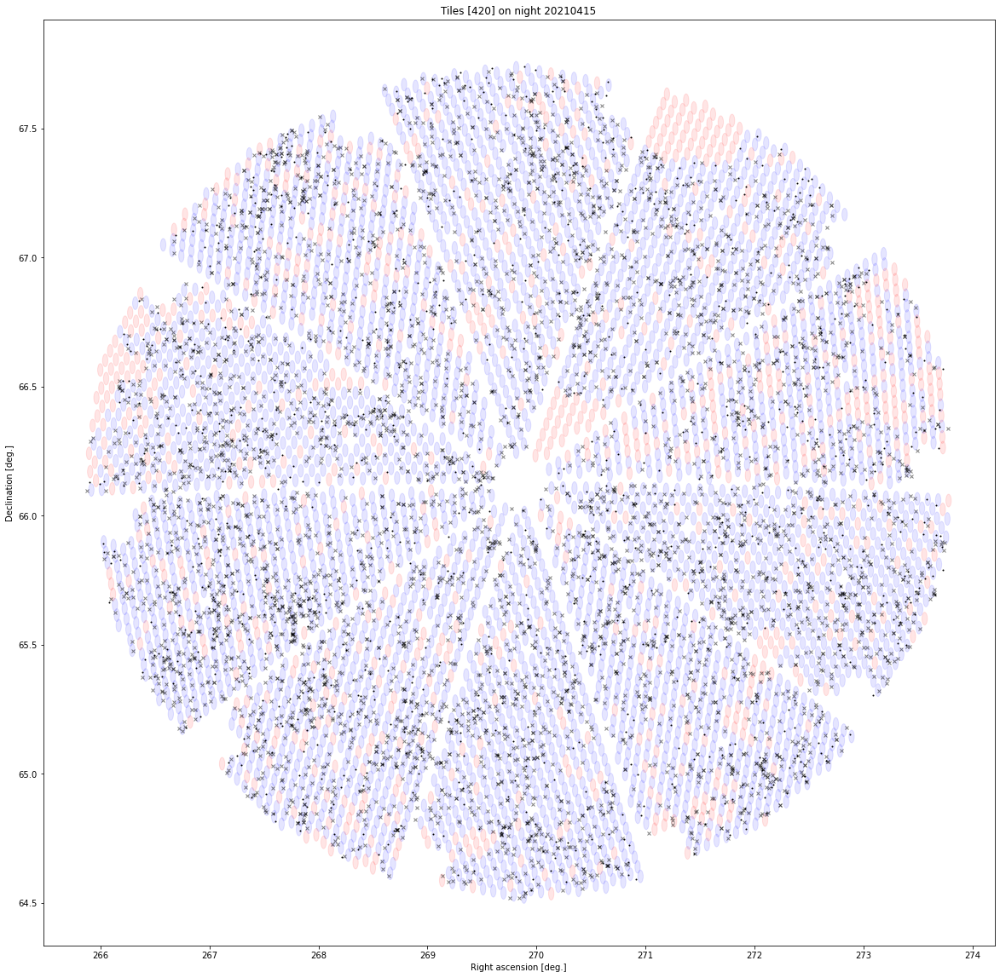

20210416 []
20210417 [421]


<Figure size 432x288 with 0 Axes>

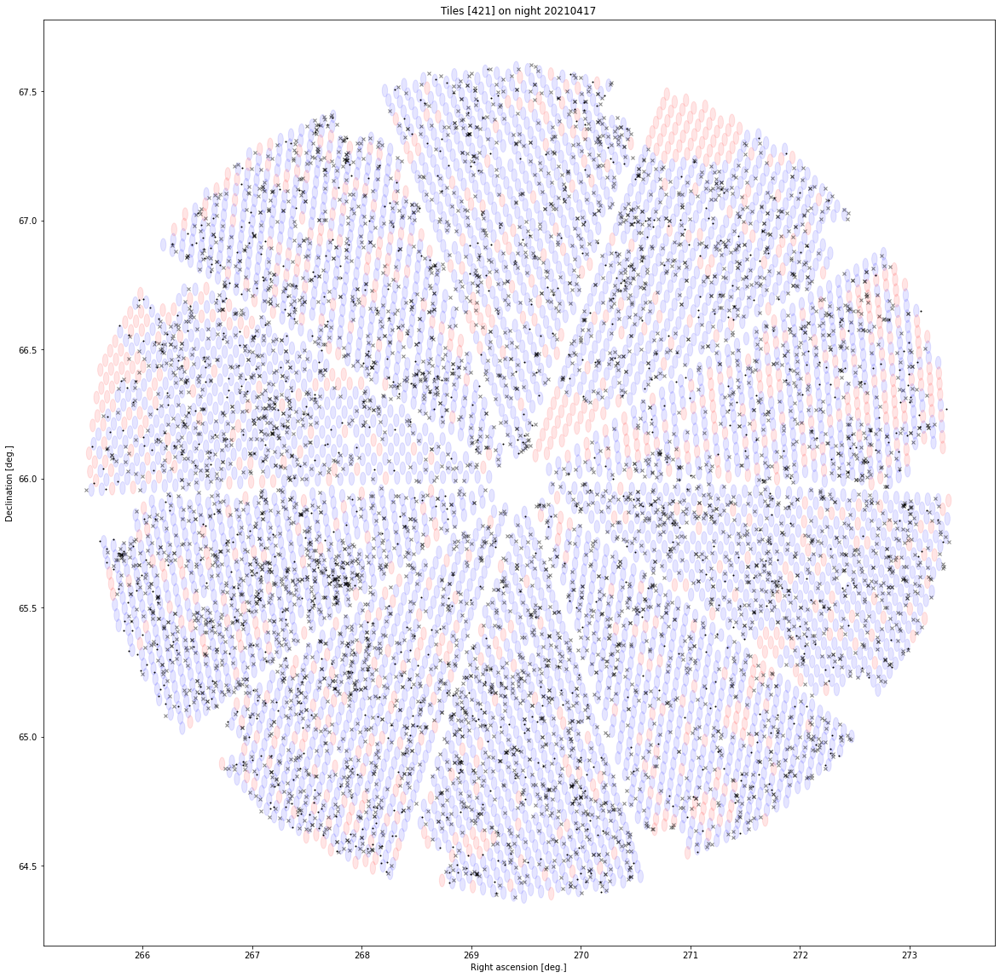

20210418 []
20210419 []
20210420 [422]


<Figure size 432x288 with 0 Axes>

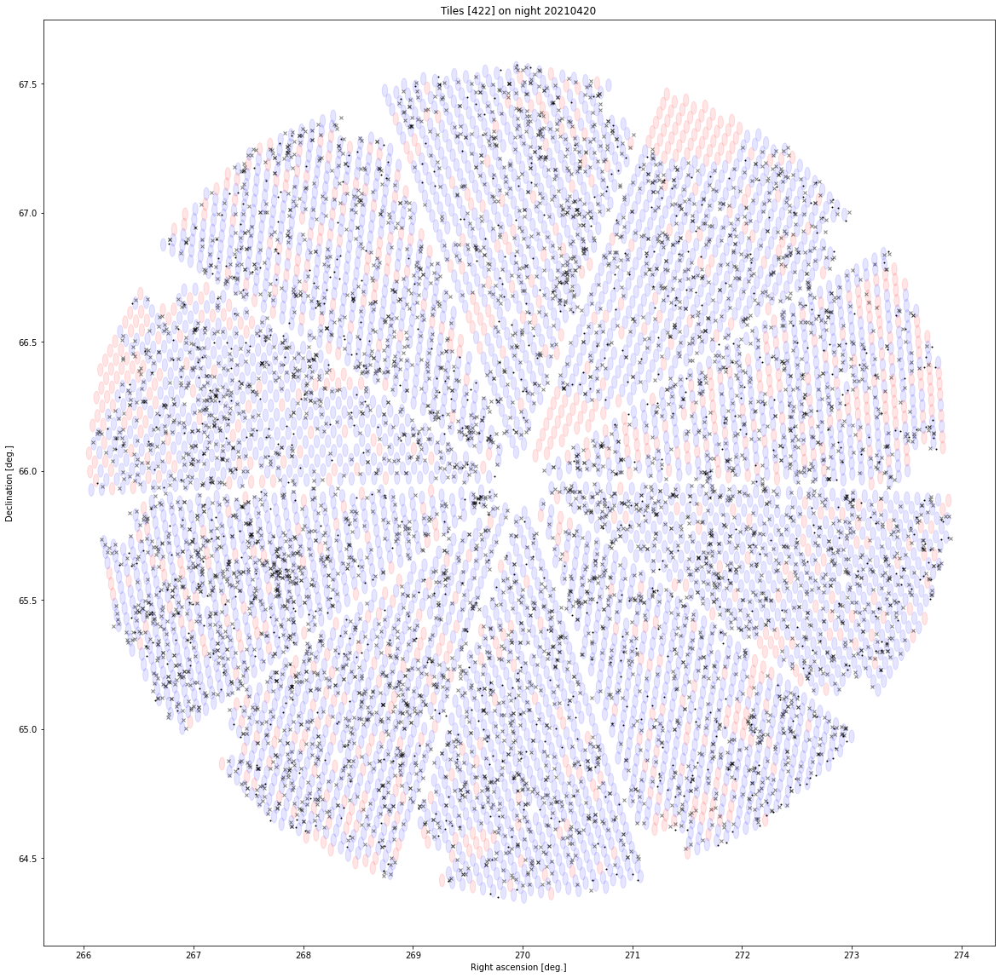

20210422 [423]


<Figure size 432x288 with 0 Axes>

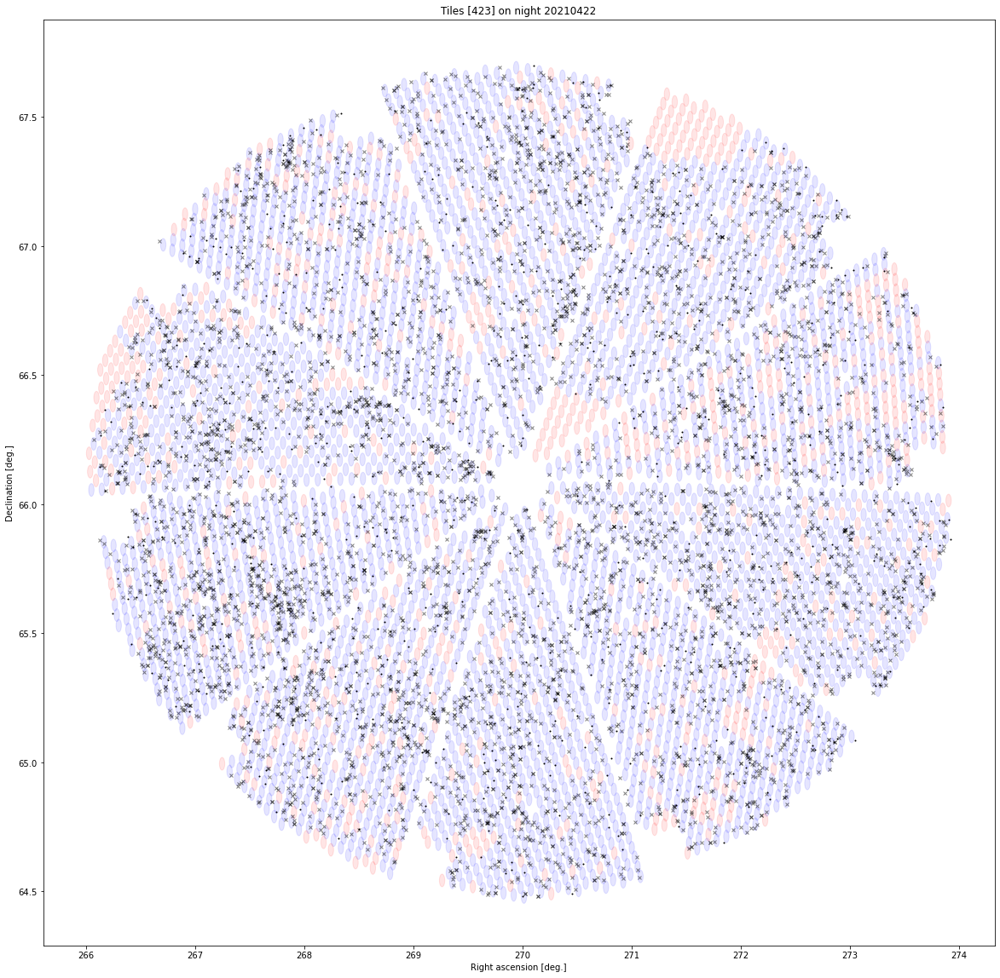

20210429 [424]


<Figure size 432x288 with 0 Axes>

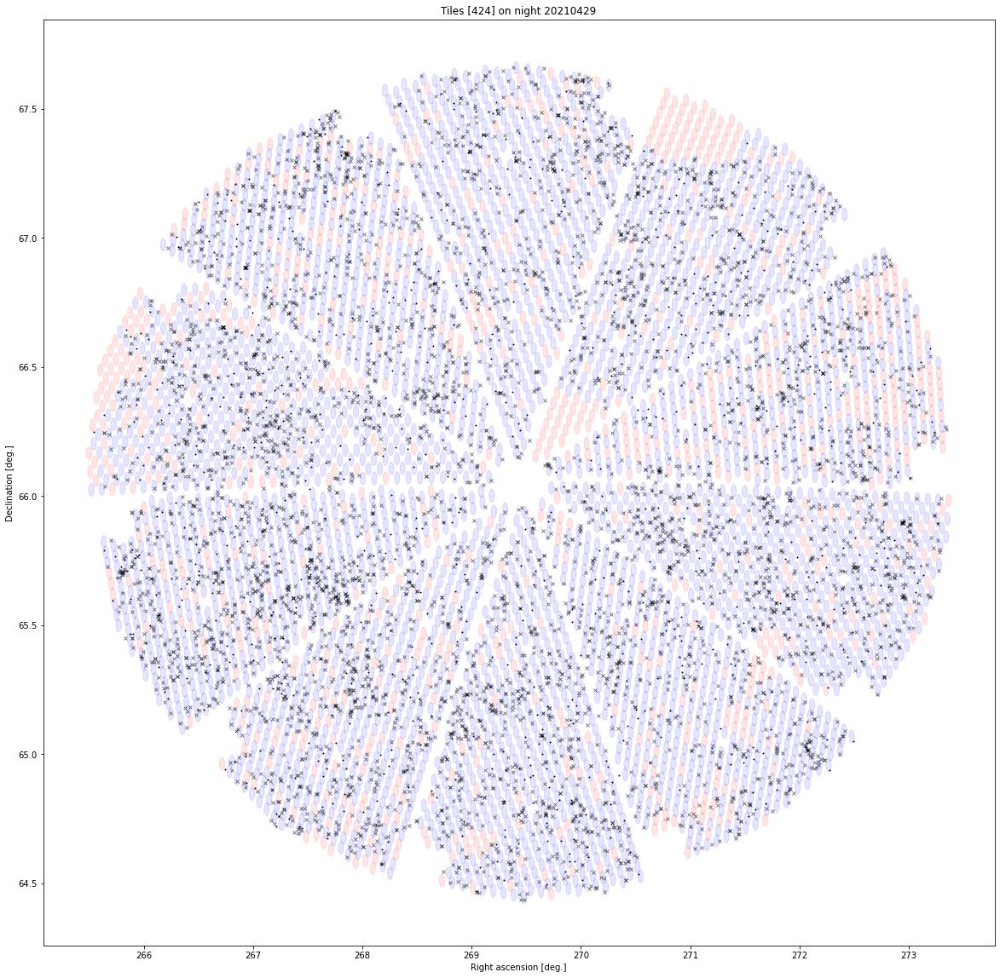

20210430 []
20210501 [425]


<Figure size 432x288 with 0 Axes>

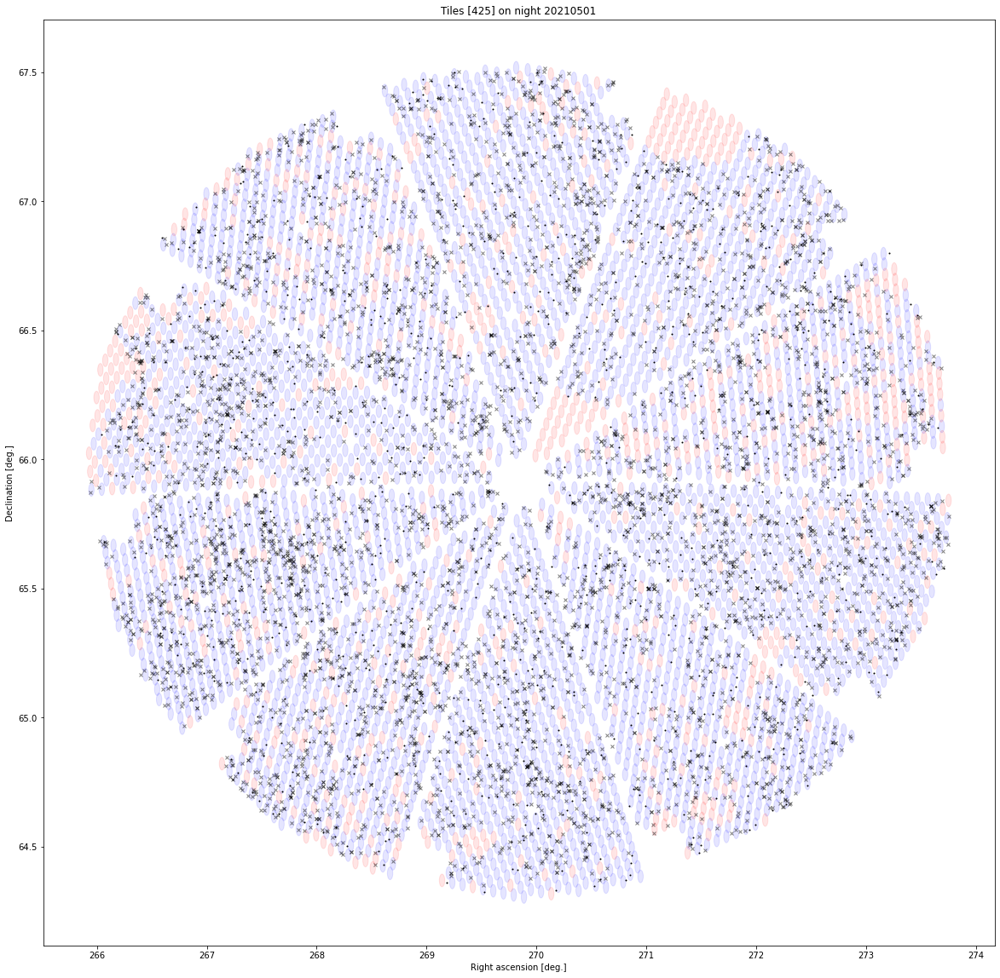

20210502 []
20210503 []
20210504 []
20210505 []
20210506 []
20210507 []
20210508 [426]


<Figure size 432x288 with 0 Axes>

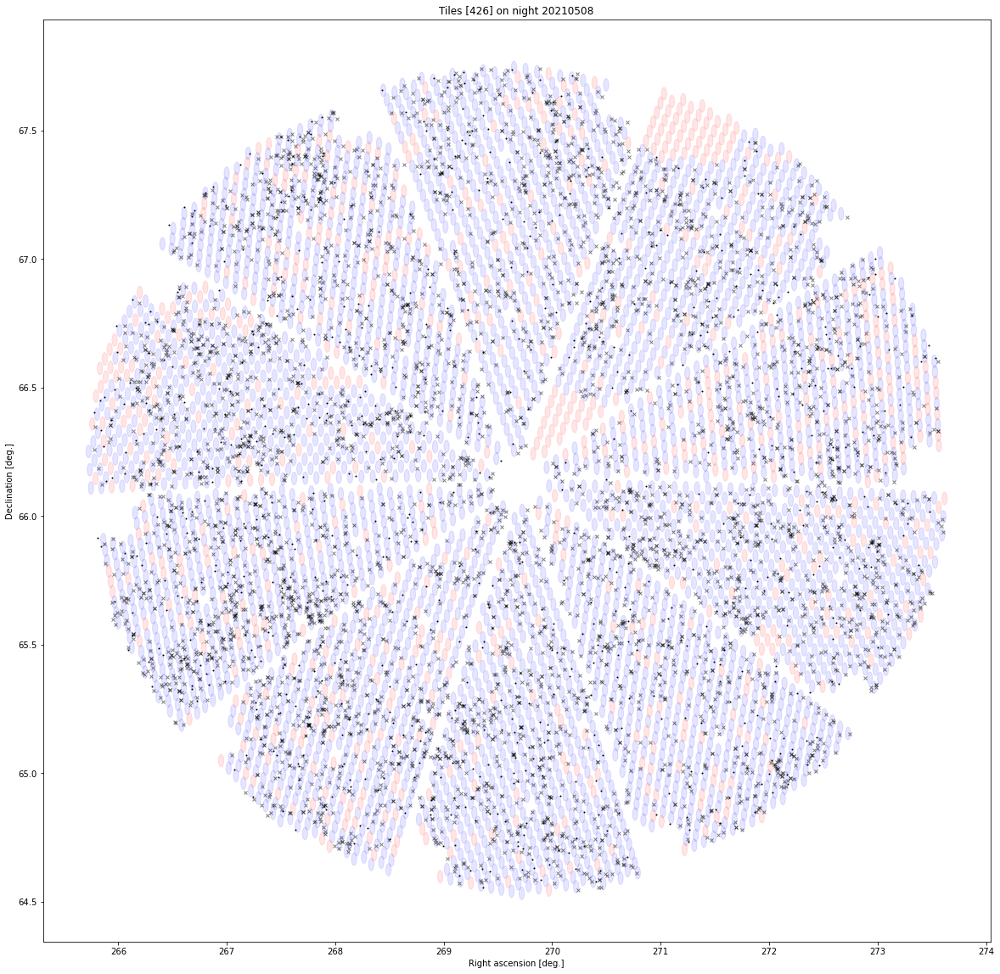

20210509 []
20210510 []
20210511 []
20210512 []
20210513 []
20210514 []
20210518 []
20210521 []
20210529 [427]


<Figure size 432x288 with 0 Axes>

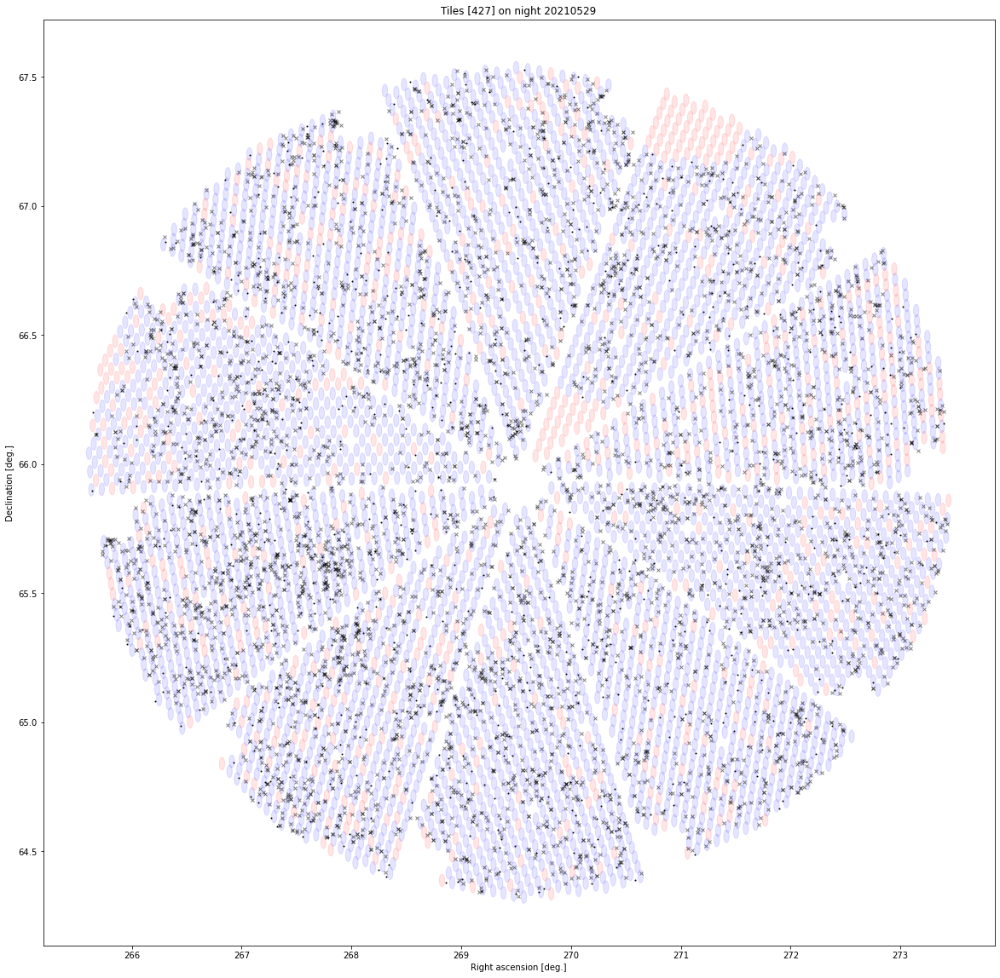

<Figure size 432x288 with 0 Axes>

In [159]:
for night in nights:
    fbas      = sorted(glob.glob(root + '/' + night + '/fba-*.fits'))
    ts        = np.array([x.split('/')[-1].replace('.fits','').replace('fba-','') for x in fbas]).astype(np.int64)
    
    ts        = ts[np.isin(ts, tids)]
    
    print(night, ts)
    
    if len(ts) == 0:
        continue

    fig, axes = plt.subplots(len(ts), 1, figsize=(20*len(ts),20))

    if len(ts) == 1:
        axes  = np.array([axes])

    for i, tid in enumerate(ts):
        fpath = root + '/' + night + '/fba-{:06d}.fits'.format(tid)
        tpath = root + '/' + night + '/{:06d}-targ.fits'.format(tid)

        tra   = fits.open(fpath)[1].header['TILERA']
        tdec  = fits.open(fpath)[1].header['TILEDEC']
        
        targ  = Table.read(tpath)
        fba   = Table.read(fpath, hdu='FASSIGN')
        ftarg = Table.read(fpath, hdu='FTARGETS')
        favl  = Table.read(fpath, hdu='FAVAIL')
    
        # Only keep targets available to a good fiber. 
        favl  = favl[np.isin(favl['LOCATION'], fba['LOCATION'].data[good_fib])] 
    
        favl  = join(favl, ledger, keys='TARGETID', join_type='left')
        fba   = join(fba,  ledger, keys='TARGETID', join_type='left')
        
        # Keep only the matches.  What about the rest??
        favl  = favl[~favl['RA'].mask]

        # 
        fba   = fba[fba['FIBERSTATUS'] == 0]

        # Keep available only if unassigned.
        favl  = favl[~np.isin(favl['TARGETID'].data, fba['TARGETID'])]
        
        gloc  = fba['LOCATION']
        
        # Keep only BGS Bright.
        fba   = fba[(fba['SV3_BGS_TARGET'].data & bgs_mask['BGS_BRIGHT']) != 0] 

        favl  = favl[(favl['SV3_BGS_TARGET'].data & bgs_mask['BGS_BRIGHT']) != 0] 
        
        plt.sca(axes[i])
 
        ra, dec = xy2radec(tra, tdec, fp["X"], fp["Y"])

        circles(ra[ np.isin(fp['LOCATION'], gloc)], dec[ np.isin(fp['LOCATION'], gloc)], s=patrol_radii, alpha=0.1)  
        circles(ra[~np.isin(fp['LOCATION'], gloc)], dec[~np.isin(fp['LOCATION'], gloc)], s=patrol_radii, alpha=0.1, c='r')
    
        # np.mean(np.isin(fba['TARGETID'].data, ledger['TARGETID'].data))
    
        # Plot targets available to a good fiber.
        pl.plot(favl['RA'].data, favl['DEC'].data, marker='x', lw=0.0, markersize=4, c='k', alpha=0.5)

        # Plot targets assigned to a good fiber.
        pl.plot(fba['TARGET_RA'].data, fba['TARGET_DEC'].data, marker='.', lw=0.0, markersize=2, c='k')
            
    pl.xlabel('Right ascension [deg.]')
    pl.ylabel('Declination [deg.]')        
    pl.title('Tiles {} on night {}'.format(ts, night))
    pl.show()
    pl.clf()

# Done.